In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
from prophet import Prophet

c:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df = pd.read_csv("./data/SriLanka_Weather_Dataset_V1.csv")

In [3]:
df.head(5)

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,1/1/2010,2,30.0,22.7,26.1,34.4,25.2,29.2,6:22:00 AM,6:05:00 PM,...,0,11.7,27.4,20,4.58,7.0,79.899994,16,Sri Lanka,Colombo
1,1/2/2010,51,29.9,23.5,26.2,33.8,26.2,29.8,6:22:00 AM,6:06:00 PM,...,1,13.0,27.0,24,3.84,7.0,79.899994,16,Sri Lanka,Colombo
2,1/3/2010,51,29.5,23.2,26.0,34.3,26.3,29.9,6:23:00 AM,6:06:00 PM,...,3,12.3,27.4,16,3.65,7.0,79.899994,16,Sri Lanka,Colombo
3,1/4/2010,2,28.9,21.9,25.3,31.6,23.4,27.8,6:23:00 AM,6:07:00 PM,...,0,17.0,34.6,356,3.79,7.0,79.899994,16,Sri Lanka,Colombo
4,1/5/2010,1,28.1,21.3,24.5,30.1,23.1,26.1,6:23:00 AM,6:07:00 PM,...,0,18.7,37.1,355,4.97,7.0,79.899994,16,Sri Lanka,Colombo


In [4]:
df.isna().sum()

time                          0
weathercode                   0
temperature_2m_max            0
temperature_2m_min            0
temperature_2m_mean           0
apparent_temperature_max      0
apparent_temperature_min      0
apparent_temperature_mean     0
sunrise                       0
sunset                        0
shortwave_radiation_sum       0
precipitation_sum             0
rain_sum                      0
snowfall_sum                  0
precipitation_hours           0
windspeed_10m_max             0
windgusts_10m_max             0
winddirection_10m_dominant    0
et0_fao_evapotranspiration    0
latitude                      0
longitude                     0
elevation                     0
country                       0
city                          0
dtype: int64

In [5]:
df['time'] = pd.to_datetime(df['time'], format='%m/%d/%Y')
df['time'] = df['time'].dt.strftime('%Y-%m-%d')

In [6]:
df = df.rename(columns={
    'time': 'ds',
    'rain_sum': 'y'
})

In [7]:
df = df.drop([
    'country', 'sunrise', 'sunset', 'snowfall_sum', 'weathercode','latitude', 'longitude', 'elevation'], axis=1
)

In [8]:
regressors = [
    'temperature_2m_max',
    'temperature_2m_min',
    'temperature_2m_mean',
    'apparent_temperature_max',
    'apparent_temperature_min',
    'apparent_temperature_mean',
    'shortwave_radiation_sum',
    'precipitation_sum',
    'precipitation_hours',
    'windspeed_10m_max',
    'windgusts_10m_max',
    'winddirection_10m_dominant',
    'et0_fao_evapotranspiration'
]

In [9]:
df = df.rename(columns={
    'date': 'ds',
    'rain_sum': 'y'
})

In [10]:
cities = df['city'].unique()

In [11]:
models = {}
forecasts = {}
comparisons ={}

In [16]:
for c in cities:
    df_city = df[df['city'] == c].copy()
    model = Prophet()
    for r in regressors:
        model.add_regressor(r)
    
    df_city_train = df_city[['ds', 'y'] + regressors].iloc[:3000]
    df_city_predict = df_city[['ds', 'y'] + regressors].copy()  # Added 'y' and .copy()
    
    model.fit(df_city_train)
    forecast = model.predict(df_city_predict[['ds'] + regressors])  # Prophet doesn't need 'y' for prediction
    
    models[c] = model
    forecasts[c] = forecast
    
    df_city_predict['ds'] = pd.to_datetime(df_city_predict['ds'])
    
    comparison = df_city_predict[['ds', 'y']].merge(
        forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']],
        on='ds',
        how='left'
    )
    
    comparisons[c] = comparison
    actual = comparison['y']
    pred = comparison['yhat']
    
    mae = mean_absolute_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mape = np.mean(np.abs((actual - pred) / actual)) * 100
    
    print("\n===================================\n")
    print(f"City: {c}")
    print("MAE:", mae)
    print("RMSE:", rmse)
    print("MAPE:", mape)

16:58:00 - cmdstanpy - INFO - Chain [1] start processing
16:58:03 - cmdstanpy - INFO - Chain [1] done processing




City: Colombo
MAE: 0.0002628264792328791
RMSE: 0.00032261754033650533
MAPE: inf


16:58:04 - cmdstanpy - INFO - Chain [1] start processing
16:58:07 - cmdstanpy - INFO - Chain [1] done processing




City: Mount Lavinia
MAE: 0.0011949335451603912
RMSE: 0.0017383456592723388
MAPE: inf


16:58:08 - cmdstanpy - INFO - Chain [1] start processing
16:58:19 - cmdstanpy - INFO - Chain [1] done processing




City: Kesbewa
MAE: 0.009603968973105047
RMSE: 0.012119390562681681
MAPE: inf


16:58:21 - cmdstanpy - INFO - Chain [1] start processing
16:58:31 - cmdstanpy - INFO - Chain [1] done processing




City: Moratuwa
MAE: 0.00029708905787683207
RMSE: 0.00036729858449940185
MAPE: inf


16:58:35 - cmdstanpy - INFO - Chain [1] start processing
16:58:45 - cmdstanpy - INFO - Chain [1] done processing




City: Maharagama
MAE: 0.00474343630359613
RMSE: 0.006527709424846122
MAPE: inf


16:58:49 - cmdstanpy - INFO - Chain [1] start processing
16:58:59 - cmdstanpy - INFO - Chain [1] done processing




City: Ratnapura
MAE: 0.00010833329718379905
RMSE: 0.0001393817340833711
MAPE: inf


16:59:02 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing




City: Kandy
MAE: 0.00014249148426174224
RMSE: 0.00018776028026637083
MAPE: inf


16:59:08 - cmdstanpy - INFO - Chain [1] start processing
16:59:18 - cmdstanpy - INFO - Chain [1] done processing




City: Negombo
MAE: 0.0006629462042794013
RMSE: 0.00084202531852573
MAPE: inf


16:59:22 - cmdstanpy - INFO - Chain [1] start processing
16:59:32 - cmdstanpy - INFO - Chain [1] done processing




City: Sri Jayewardenepura Kotte
MAE: 0.0011724765845589507
RMSE: 0.0014597085272238196
MAPE: inf


16:59:36 - cmdstanpy - INFO - Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing




City: Kalmunai
MAE: 0.0021373544509208533
RMSE: 0.0026485194974333924
MAPE: inf


16:59:50 - cmdstanpy - INFO - Chain [1] start processing
16:59:59 - cmdstanpy - INFO - Chain [1] done processing




City: Trincomalee
MAE: 0.002586669711115148
RMSE: 0.003647929800637939
MAPE: inf


17:00:00 - cmdstanpy - INFO - Chain [1] start processing
17:00:03 - cmdstanpy - INFO - Chain [1] done processing




City: Galle
MAE: 0.0033315382130321065
RMSE: 0.004836324730497966
MAPE: inf


17:00:04 - cmdstanpy - INFO - Chain [1] start processing
17:00:04 - cmdstanpy - INFO - Chain [1] done processing




City: Jaffna
MAE: 7.294542946367473e-05
RMSE: 0.00010091576161965182
MAPE: inf


17:00:05 - cmdstanpy - INFO - Chain [1] start processing
17:00:13 - cmdstanpy - INFO - Chain [1] done processing




City: Athurugiriya
MAE: 0.006046439864163651
RMSE: 0.00833688463808799
MAPE: inf


17:00:14 - cmdstanpy - INFO - Chain [1] start processing
17:00:17 - cmdstanpy - INFO - Chain [1] done processing




City: Weligama
MAE: 0.0045923863187613155
RMSE: 0.006448316891924299
MAPE: inf


17:00:18 - cmdstanpy - INFO - Chain [1] start processing
17:00:22 - cmdstanpy - INFO - Chain [1] done processing




City: Matara
MAE: 0.002242602900558809
RMSE: 0.003161801415639129
MAPE: inf


17:00:22 - cmdstanpy - INFO - Chain [1] start processing
17:00:26 - cmdstanpy - INFO - Chain [1] done processing




City: Kolonnawa
MAE: 0.006698672573765943
RMSE: 0.009713106314094534
MAPE: inf


17:00:27 - cmdstanpy - INFO - Chain [1] start processing
17:00:30 - cmdstanpy - INFO - Chain [1] done processing




City: Gampaha
MAE: 0.0007137077705375396
RMSE: 0.0009940407734674351
MAPE: inf


17:00:31 - cmdstanpy - INFO - Chain [1] start processing
17:00:31 - cmdstanpy - INFO - Chain [1] done processing
17:00:32 - cmdstanpy - INFO - Chain [1] start processing




City: Puttalam
MAE: 6.387196721057775e-05
RMSE: 8.40567229861934e-05
MAPE: inf


17:00:36 - cmdstanpy - INFO - Chain [1] done processing




City: Badulla
MAE: 0.0007526728648919625
RMSE: 0.0010569146458556397
MAPE: inf


17:00:36 - cmdstanpy - INFO - Chain [1] start processing
17:00:40 - cmdstanpy - INFO - Chain [1] done processing




City: Kalutara
MAE: 0.0005491458998757216
RMSE: 0.0007424295366127607
MAPE: inf


17:00:40 - cmdstanpy - INFO - Chain [1] start processing
17:00:44 - cmdstanpy - INFO - Chain [1] done processing




City: Bentota
MAE: 0.0008643406072147743
RMSE: 0.0011672483557246302
MAPE: inf


17:00:44 - cmdstanpy - INFO - Chain [1] start processing
17:00:45 - cmdstanpy - INFO - Chain [1] done processing




City: Matale
MAE: 0.00010996353732836616
RMSE: 0.00014161014449089431
MAPE: inf


17:00:46 - cmdstanpy - INFO - Chain [1] start processing
17:00:49 - cmdstanpy - INFO - Chain [1] done processing




City: Mannar
MAE: 0.0023078451549419263
RMSE: 0.0031481196344463032
MAPE: inf


17:00:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:51 - cmdstanpy - INFO - Chain [1] done processing




City: Pothuhera
MAE: 0.0005062167552035547
RMSE: 0.0007389805695918708
MAPE: inf


17:00:51 - cmdstanpy - INFO - Chain [1] start processing
17:00:52 - cmdstanpy - INFO - Chain [1] done processing
17:00:53 - cmdstanpy - INFO - Chain [1] start processing




City: Kurunegala
MAE: 0.00027258508244815724
RMSE: 0.00037031692836649163
MAPE: inf


17:00:56 - cmdstanpy - INFO - Chain [1] done processing




City: Mabole
MAE: 0.0008440749699083805
RMSE: 0.0010697502243960134
MAPE: inf


17:00:57 - cmdstanpy - INFO - Chain [1] start processing
17:01:00 - cmdstanpy - INFO - Chain [1] done processing




City: Hatton
MAE: 0.000645904906304623
RMSE: 0.0008080913584543089
MAPE: inf


17:01:01 - cmdstanpy - INFO - Chain [1] start processing
17:01:04 - cmdstanpy - INFO - Chain [1] done processing




City: Hambantota
MAE: 0.00044852825810001295
RMSE: 0.0005742361459887155
MAPE: inf


17:01:05 - cmdstanpy - INFO - Chain [1] start processing
17:01:09 - cmdstanpy - INFO - Chain [1] done processing




City: Oruwala
MAE: 0.0012937988103161303
RMSE: 0.0018912884865958446
MAPE: inf


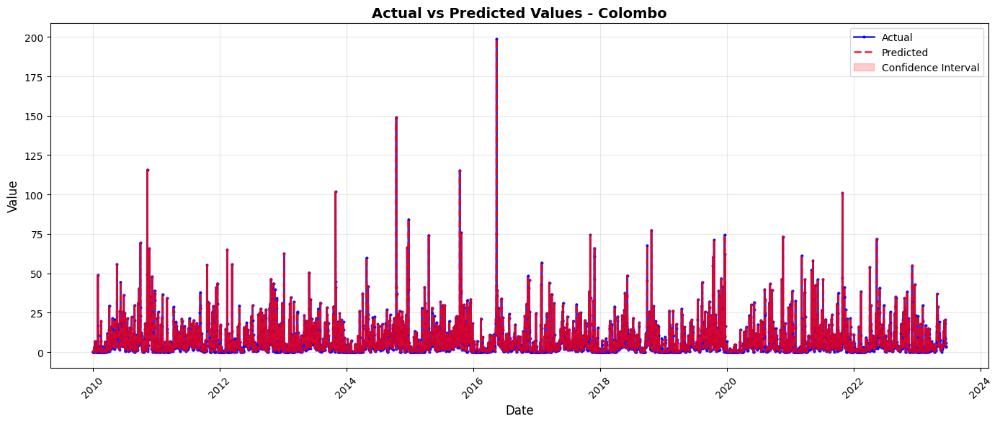

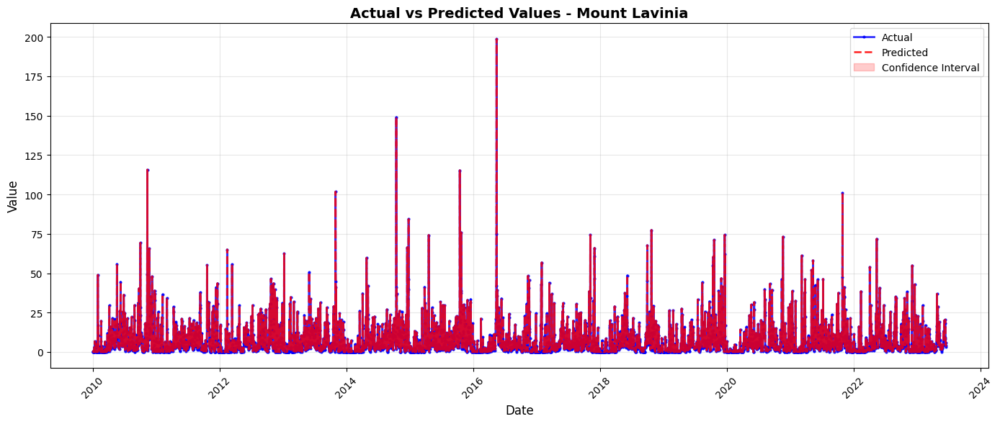

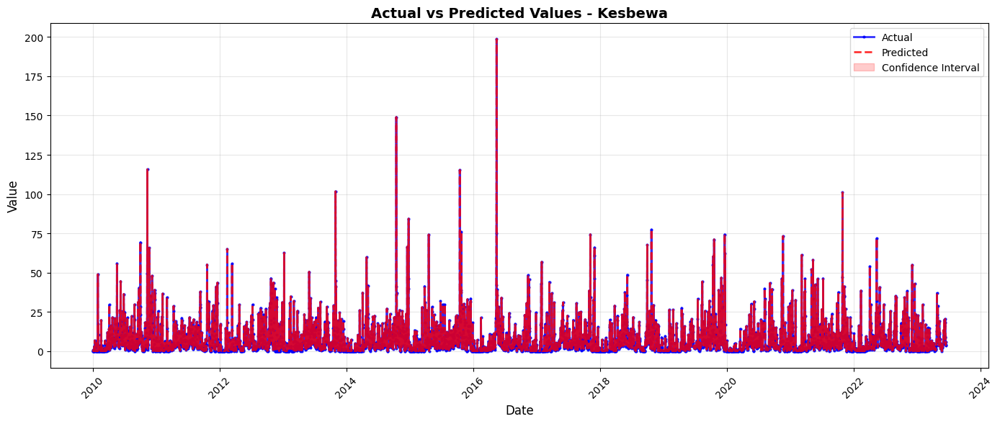

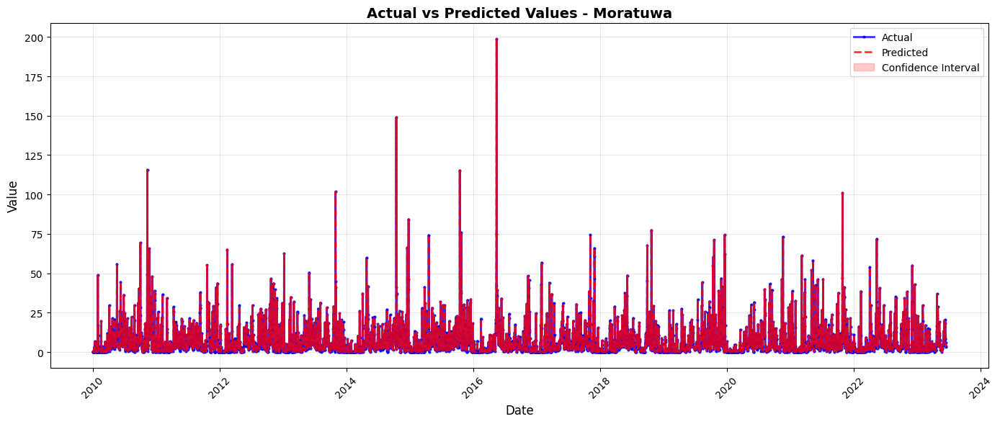

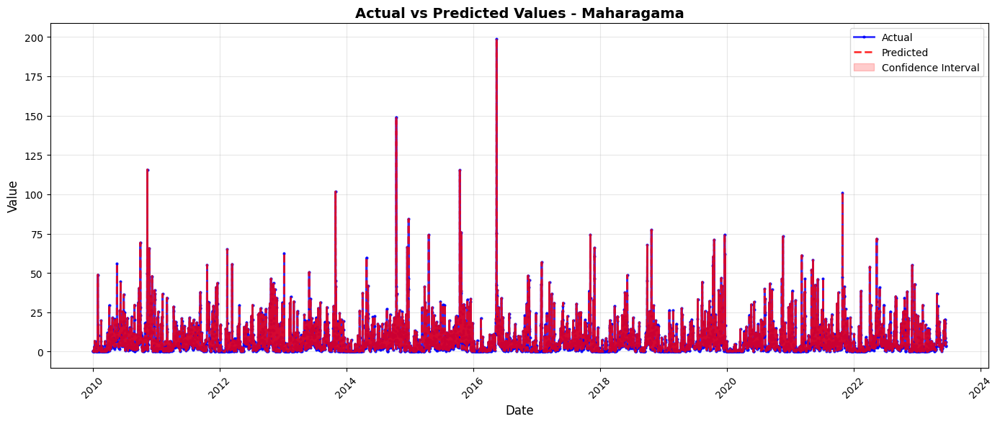

...

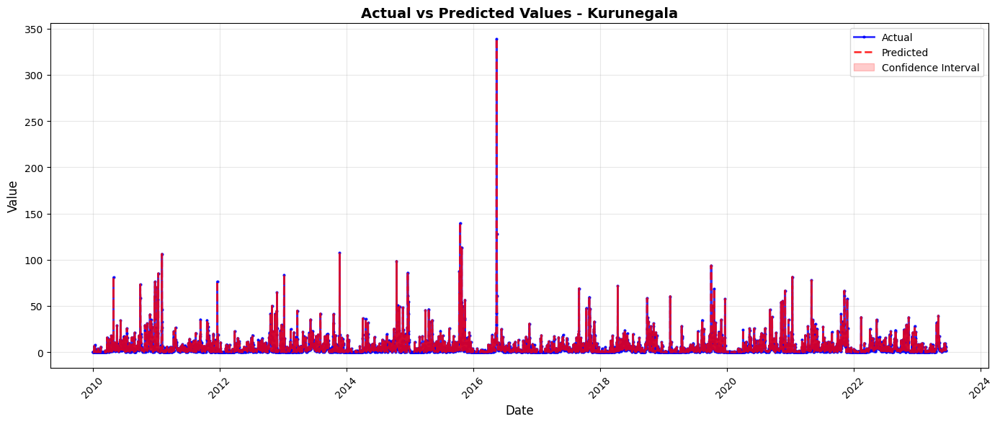

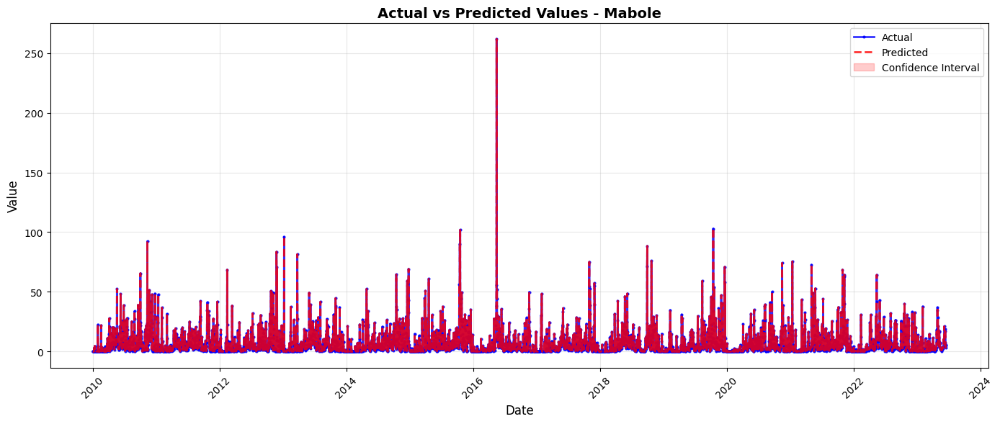

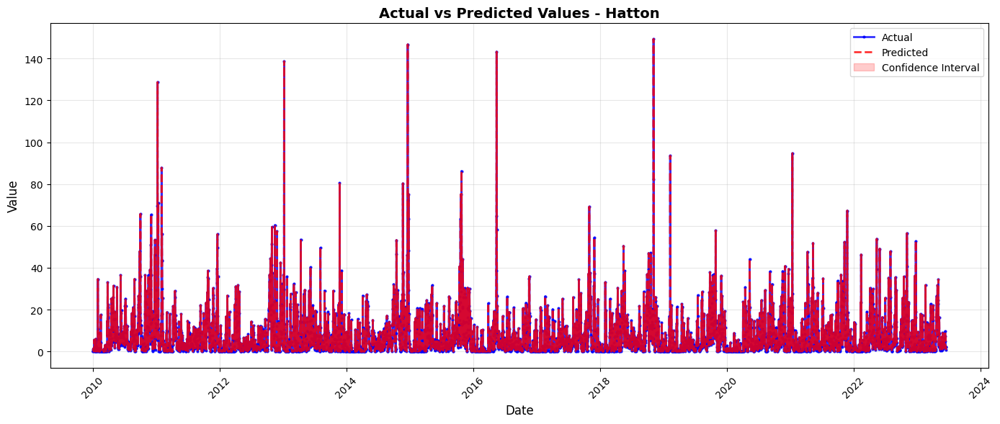

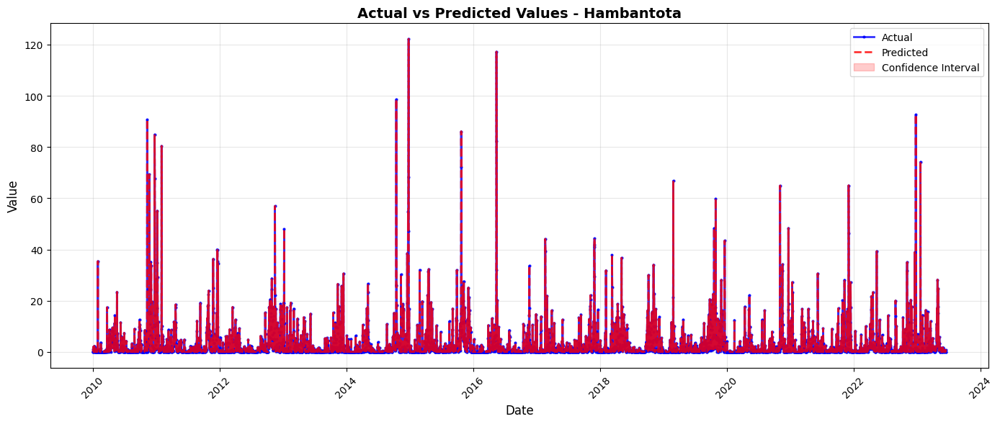

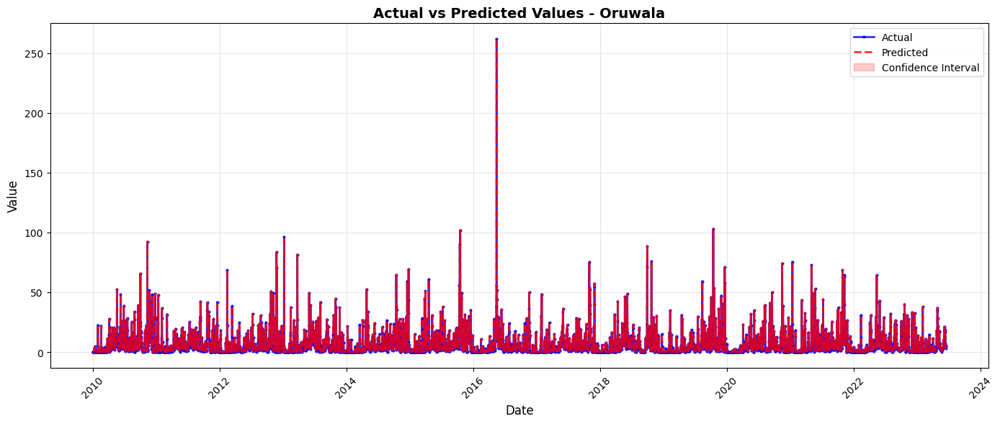

In [20]:
# Plot each city's comparison
for city, comparison_df in comparisons.items():
    plt.figure(figsize=(14, 6))
    
    # Plot actual values with markers
    plt.plot(comparison_df['ds'], comparison_df['y'], 
             label='Actual', color='blue', linewidth=2, alpha=0.8, marker='o', markersize=2)
    
    # Plot predicted values with dashed line
    plt.plot(comparison_df['ds'], comparison_df['yhat'], 
             label='Predicted', color='red', linewidth=2, alpha=0.8, linestyle='--')
    
    # Plot confidence intervals
    plt.fill_between(comparison_df['ds'], 
                     comparison_df['yhat_lower'], 
                     comparison_df['yhat_upper'],
                     color='red', alpha=0.2, label='Confidence Interval')
    
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.title(f'Actual vs Predicted Values - {city}', fontsize=14, fontweight='bold')
    plt.legend(loc='best')
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

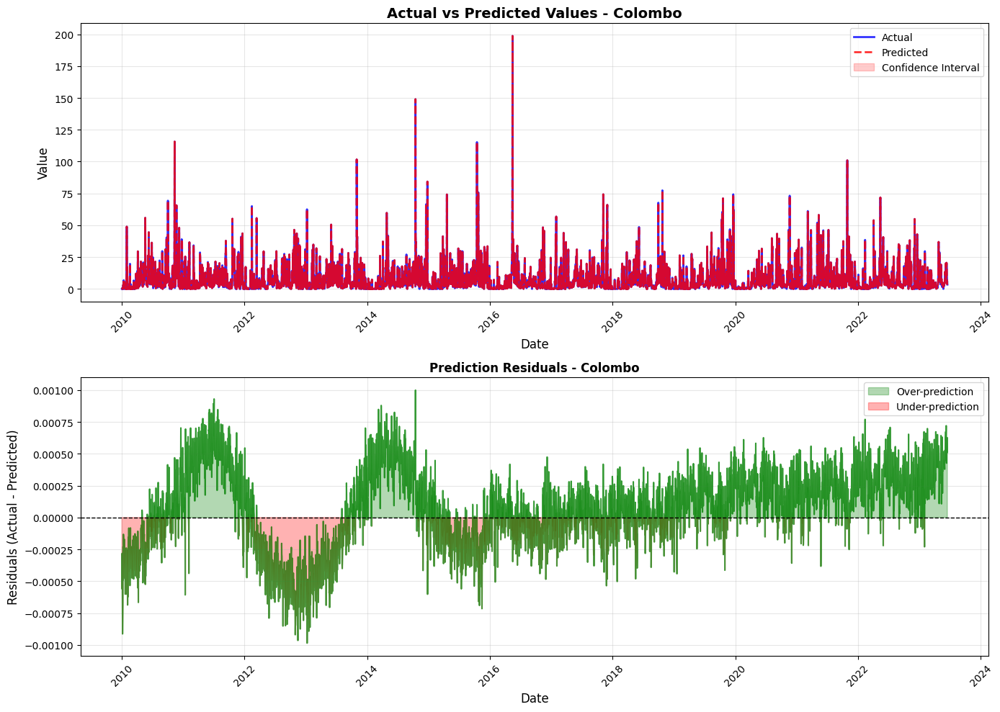

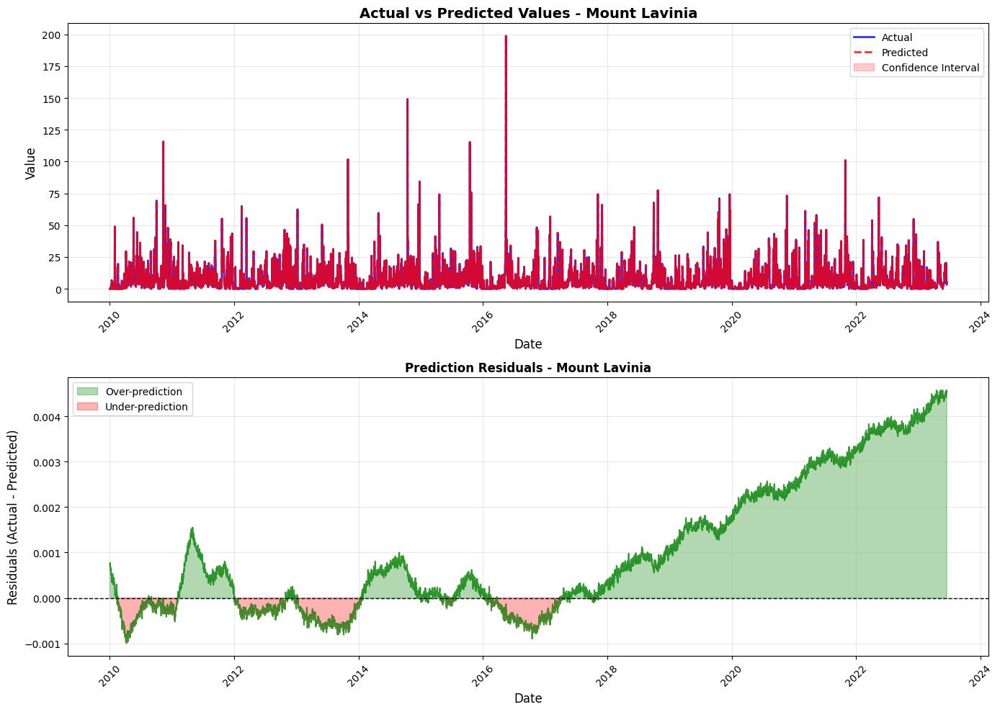

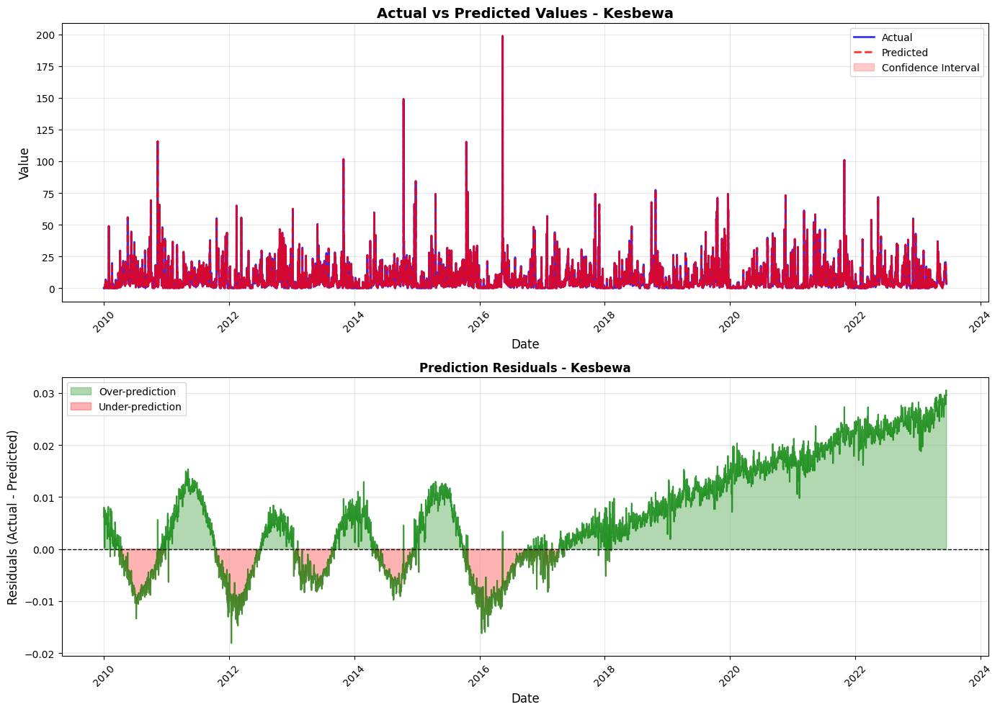

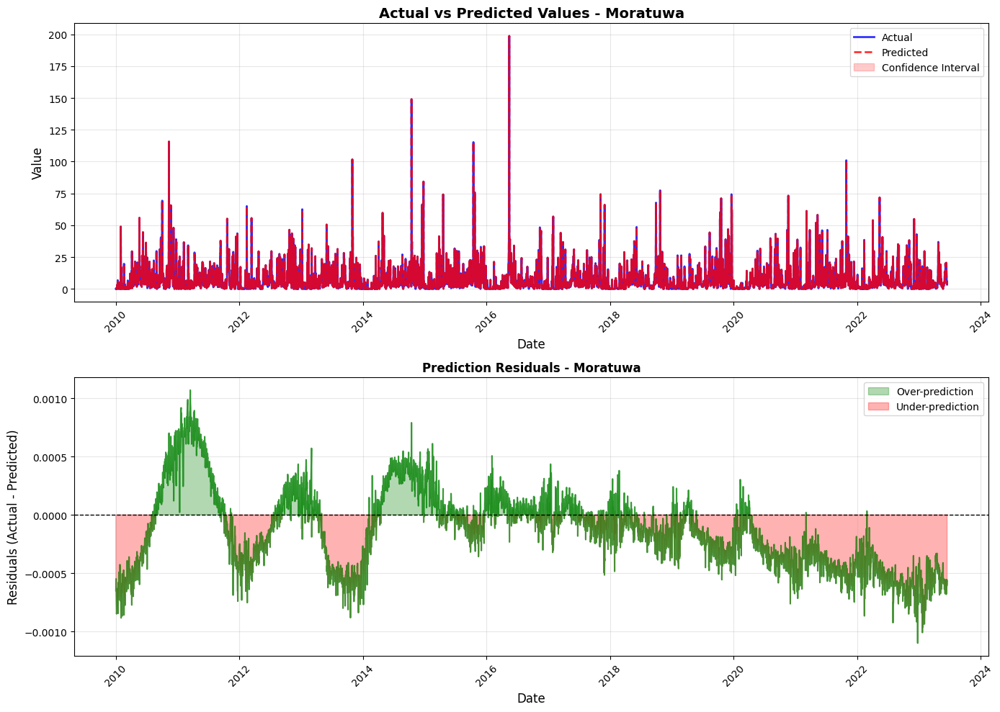

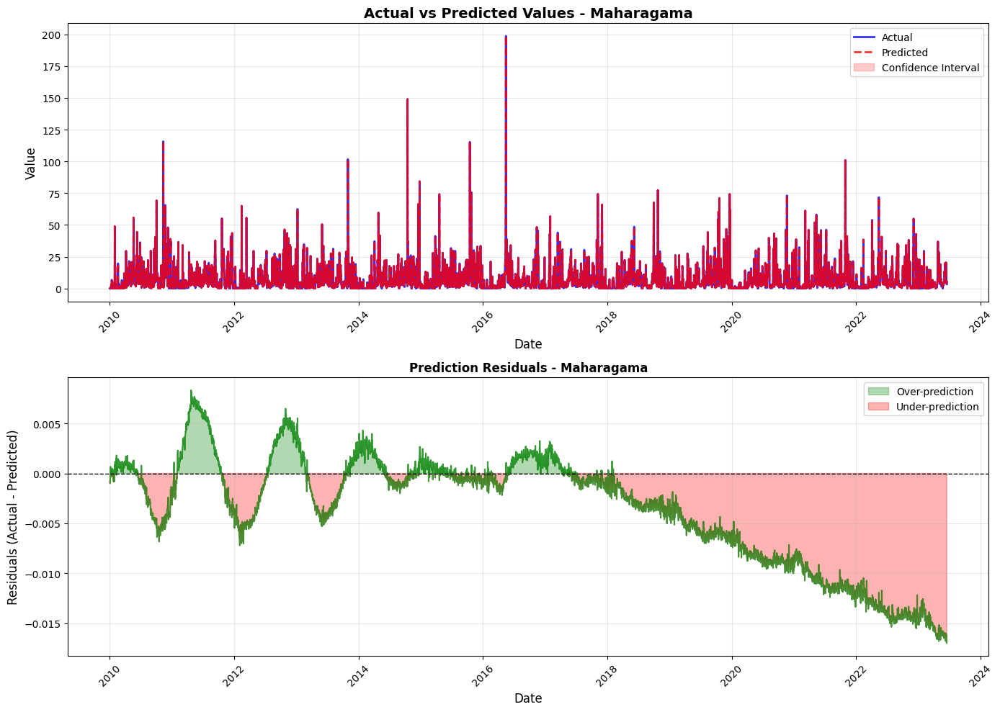

...

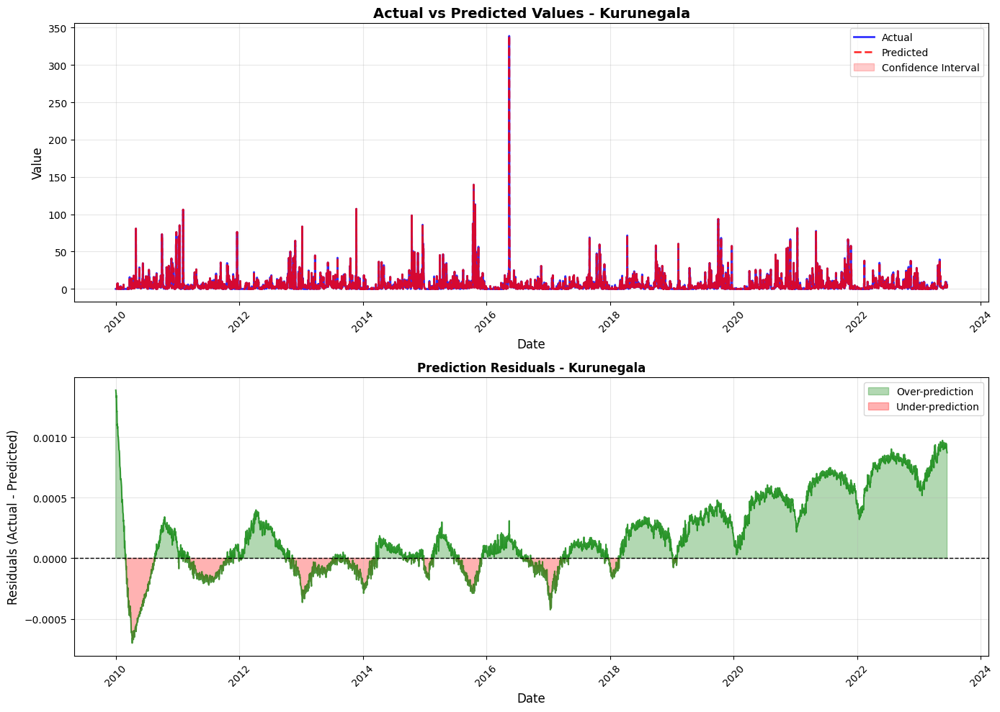

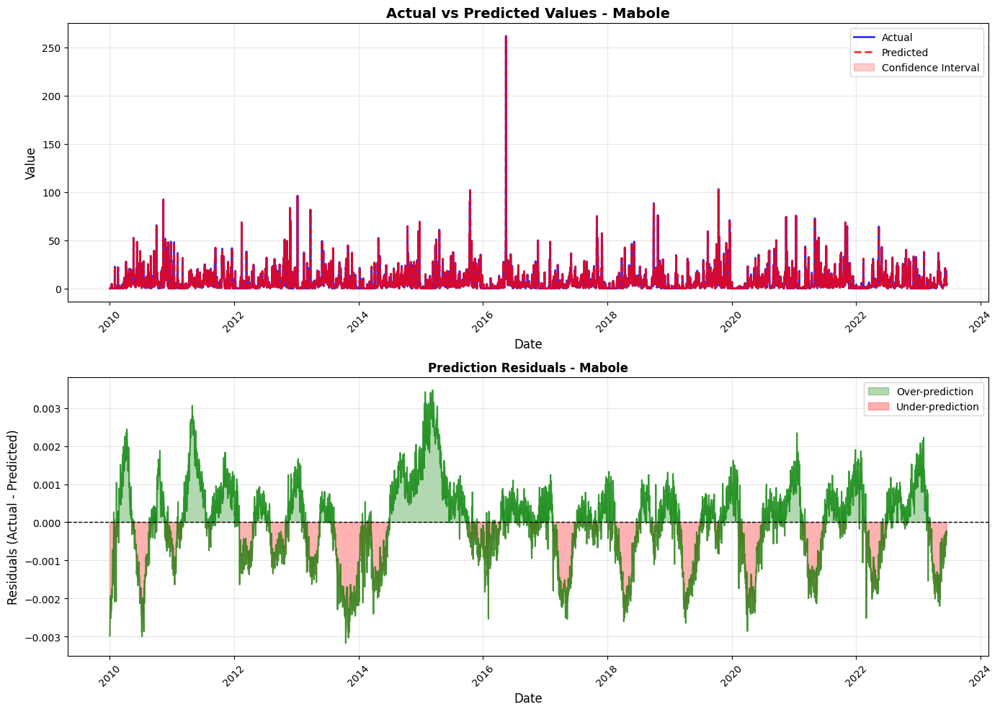

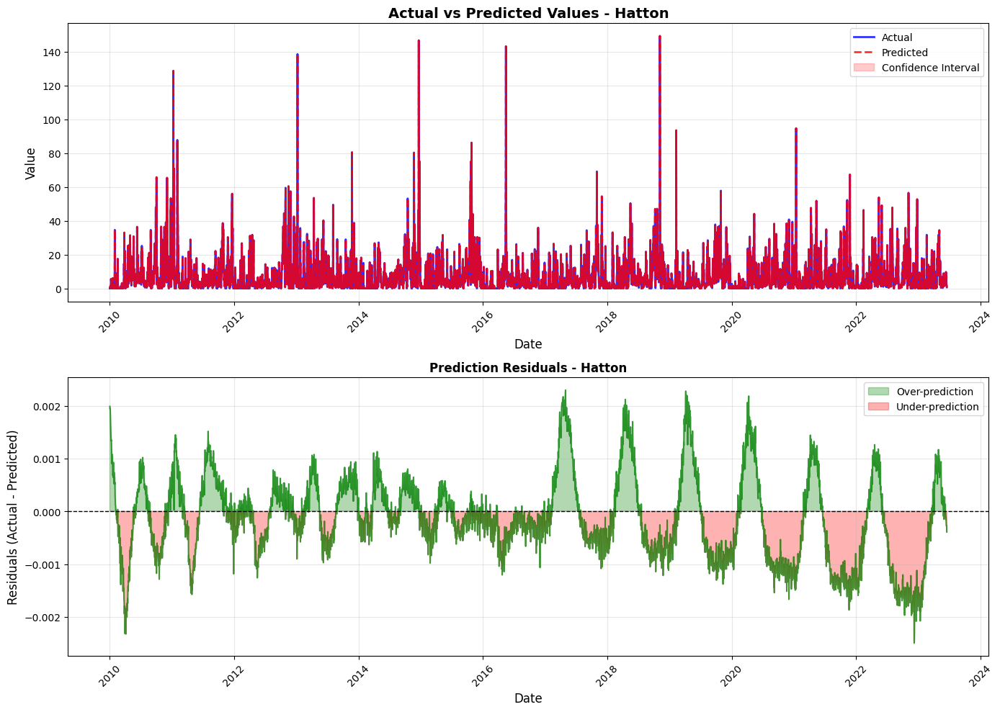

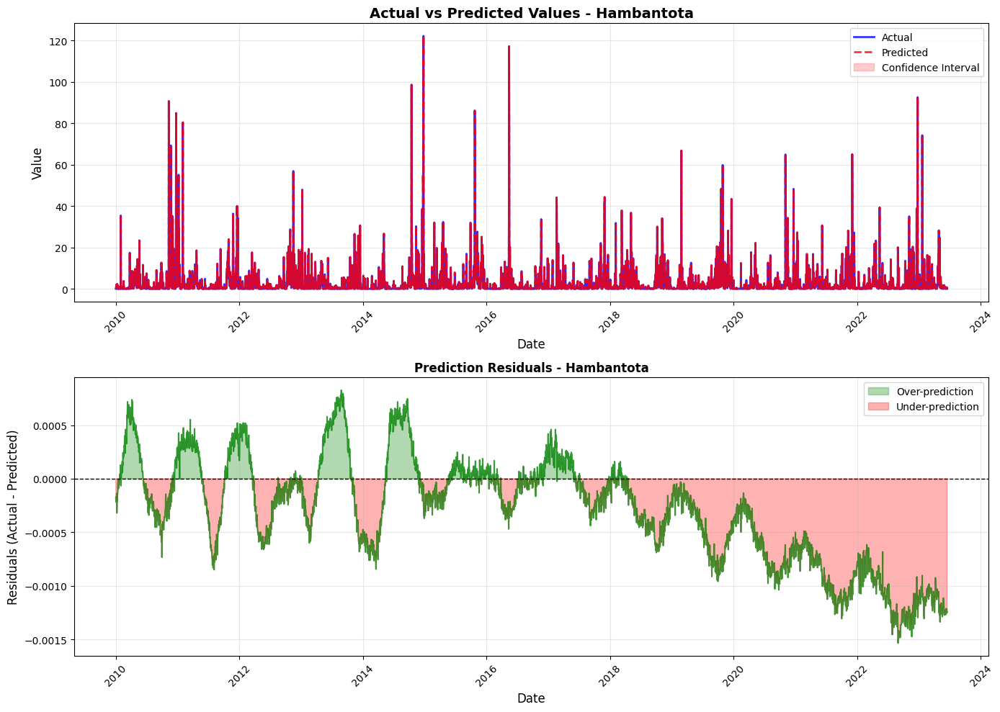

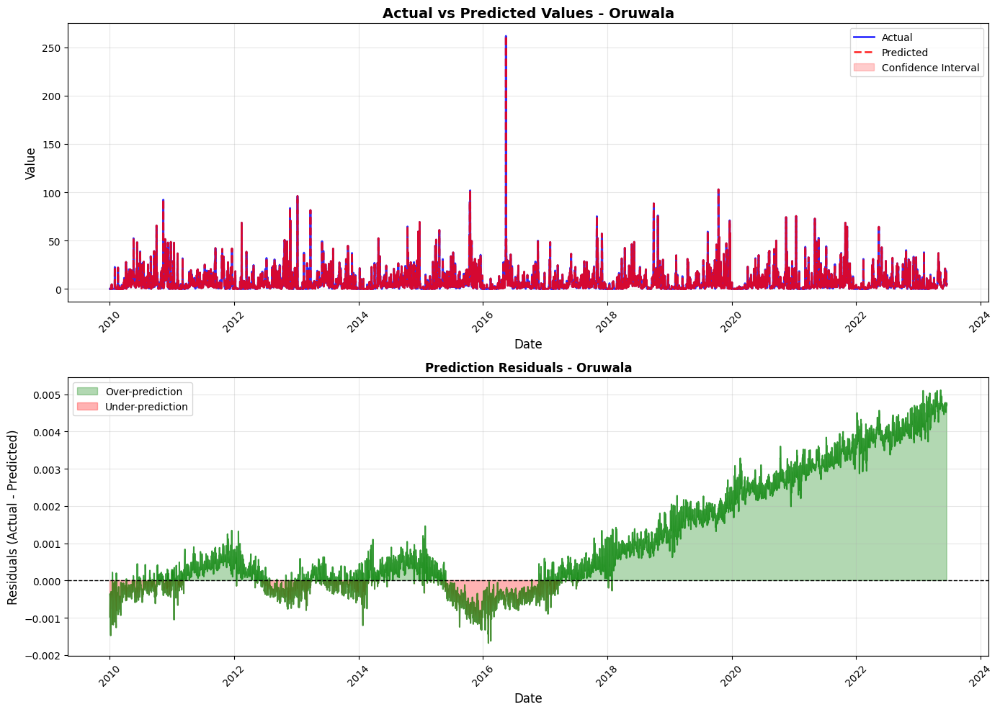

In [18]:
# Plot each city's comparison
for city, comparison_df in comparisons.items():
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
    
    # Top plot: Actual vs Predicted
    ax1.plot(comparison_df['ds'], comparison_df['y'], 
             label='Actual', color='blue', linewidth=2, alpha=0.8)
    ax1.plot(comparison_df['ds'], comparison_df['yhat'], 
             label='Predicted', color='red', linewidth=2, alpha=0.8, linestyle='--')
    ax1.fill_between(comparison_df['ds'], 
                     comparison_df['yhat_lower'], 
                     comparison_df['yhat_upper'],
                     color='red', alpha=0.2, label='Confidence Interval')
    ax1.set_xlabel('Date', fontsize=12)
    ax1.set_ylabel('Value', fontsize=12)
    ax1.set_title(f'Actual vs Predicted Values - {city}', fontsize=14, fontweight='bold')
    ax1.legend(loc='best')
    ax1.grid(True, alpha=0.3)
    ax1.tick_params(axis='x', rotation=45)
    
    # Bottom plot: Residuals (difference between actual and predicted)
    residuals = comparison_df['y'] - comparison_df['yhat']
    ax2.plot(comparison_df['ds'], residuals, 
             color='green', linewidth=1.5, alpha=0.7)
    ax2.axhline(y=0, color='black', linestyle='--', linewidth=1)
    ax2.fill_between(comparison_df['ds'], residuals, 0, 
                     where=(residuals >= 0), color='green', alpha=0.3, label='Over-prediction')
    ax2.fill_between(comparison_df['ds'], residuals, 0, 
                     where=(residuals < 0), color='red', alpha=0.3, label='Under-prediction')
    ax2.set_xlabel('Date', fontsize=12)
    ax2.set_ylabel('Residuals (Actual - Predicted)', fontsize=12)
    ax2.set_title(f'Prediction Residuals - {city}', fontsize=12, fontweight='bold')
    ax2.legend(loc='best')
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()